In [1]:
import librosa
import pandas as pd
import numpy as np
import torch
import os
import matplotlib.pyplot as plt
from IPython.display import display, Audio
import scipy.signal as signal

In [2]:
def normalize_array(arr):
    arr_min = np.min(arr)
    arr_max = np.max(arr)
    normalized_arr = (arr - arr_min) / (arr_max - arr_min)
    return normalized_arr


In [2]:
# Define a function to apply a band-stop filter
def apply_bandstop_filter(y, sr, lowcut, highcut, order=4):
    nyquist = 0.5 * sr
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = signal.butter(order, [low, high], btype='bandstop')
    y_filtered = signal.lfilter(b, a, y)
    return y_filtered

In [3]:
# Function to apply a mask to mute specific frequency bins
def mute_mel_band2(y, sr, mel_band_to_mute, n_fft=2048, hop_length=512):
    # Perform STFT
    D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    
    # Convert mel band to frequency range
    mel_basis = librosa.filters.mel(sr=sr, n_fft=n_fft, n_mels=40)
    mel_band_freqs = mel_basis[mel_band_to_mute]

    # Find frequency bins corresponding to the mel band to mute
    bin_mask = np.zeros(D.shape, dtype=bool)
    for i, freq in enumerate(freqs):
        if mel_band_freqs[0] <= freq <= mel_band_freqs[-1]:
            bin_mask[i, :] = True

    # Zero out the specified frequency bins
    D[bin_mask] = 0
    
    # Perform ISTFT
    y_filtered = librosa.istft(D, hop_length=hop_length)
    
    return y_filtered


In [48]:
# Define a function to mute specific mel frequency bands using STFT and ISTFT
def mute_mel_band(y, sr, mel_band_to_mute, n_mels=40):
    # Perform STFT
    D = librosa.stft(y)
    
    # Convert to mel scale
    mel_basis = librosa.filters.mel(sr=sr, n_fft=2048, n_mels=n_mels)
    mel_S = np.dot(mel_basis, np.abs(D))
    
    # Zero out the specified mel band
    '''log_mel = librosa.power_to_db(mel_S, ref=np.max)
    log_mel_S = torch.from_numpy(log_mel)
    log_mel_S[mel_band_to_mute] = torch.ones(log_mel_S[mel_band_to_mute].shape) * log_mel_S.min()
    mel_S = librosa.db_to_power(log_mel_S.numpy())'''

    #mel_S[mel_band_to_mute+1] = mel_S.min()
    mel_S[mel_band_to_mute, :] = mel_S.min()
    
    # Convert back to linear scale
    inv_mel_basis = np.linalg.pinv(mel_basis)
    D_filtered = np.dot(inv_mel_basis, mel_S) * np.exp(1.j * np.angle(D))
    
    # Perform ISTFT
    y_filtered = librosa.istft(D_filtered)
    
    return y_filtered

In [5]:
def generate_log_mel(wav, sr):
    mel_S = librosa.feature.melspectrogram(y=wav, sr=sr, n_mels=40)
    log_mel = librosa.power_to_db(mel_S, ref=np.max)

    librosa.display.specshow(log_mel, sr=sr, x_axis='time', y_axis='mel')
    plt.show()

In [31]:
from IPython.display import display, Audio
sample_file = '../audioData/sythenticSoundscenes/test/bus1_0.wav'
#sample_file = '/work/dpandya/giggityGit/audioData/TUTUrban2018/developmentDataset/TUT-urban-acoustic-scenes-2018-development/audio/airport-barcelona-0-1-a.wav'
wav, sr = librosa.load(sample_file, sr=32000)
#wav = normalize_array(wav)
wav_new = np.copy(wav)
wav_new = np.ones(wav_new.shape)*wav.min()
#wav_new = np.zeros(wav.shape)

display(Audio(wav, rate=sr))
display(Audio(wav_new, rate=sr))

In [64]:
lib_freq = librosa.fft_frequencies(sr=32000, n_fft=2048)
wav_stft = (librosa.stft(wav))

wav_stft.shape, lib_freq.shape

((1025, 1876), (1025,))

In [22]:
wav_stft.real.min(), wav_stft.real.max(), wav_stft.real.mean()

(-288.12054, 548.14923, 0.26260808)

In [65]:

melF = librosa.mel_frequencies(n_mels=40, fmin=0, fmax=16000)
l0 = lib_freq > melF[10]
l1 = lib_freq < melF[13]

for i in range(len(l0)):
    if l0[i] & l1[i]:
        #print(i)
        wav_stft[i,:] = np.complex64(0+0j)

In [68]:
y_new = librosa.istft(wav_stft)

display(Audio(y_new, rate=sr))

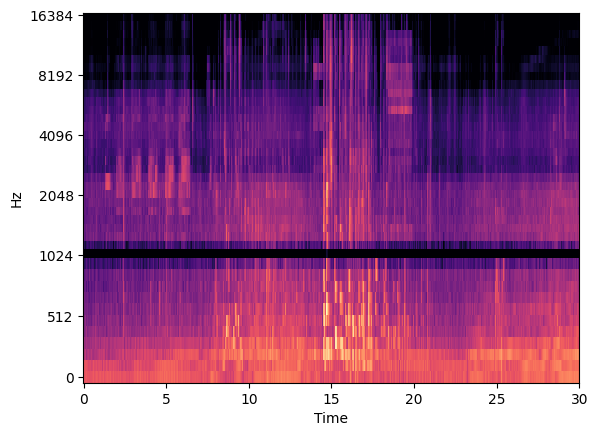

In [69]:
generate_log_mel(y_new, sr)

In [132]:
mm = wav_stft[930:1022]
mm.min(), mm.max(), mm.mean()

((-0.7799355-0.014886922j),
 (0.8591375-0.116597466j),
 (1.2009639e-07-2.1385311e-09j))

In [140]:
mm[:,2].shape

(92,)

In [141]:
mmm = mm[:,-3*(int)(1876/30)]
mmm.mean(), mmm.max(), mmm.min()

((-7.999214e-06+9.671241e-06j),
 (0.002411167+0.0021205463j),
 (-0.0022058978-0.0014436068j))

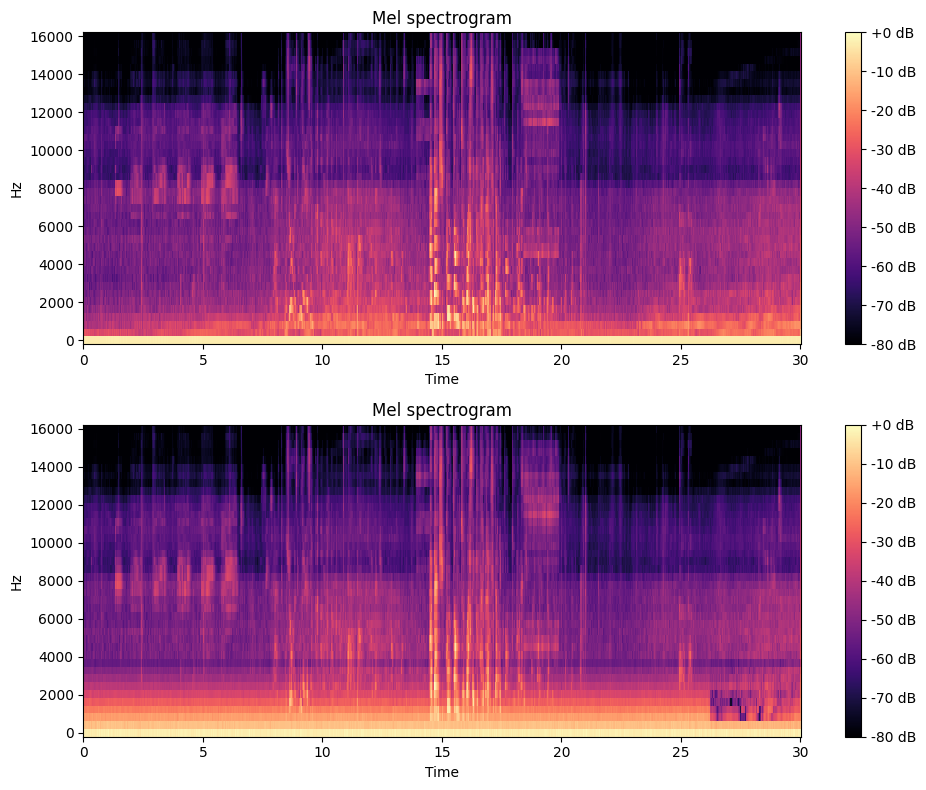

In [56]:

wav = normalize_array(wav)
melspec = librosa.feature.melspectrogram(y=wav, sr=sr, n_mels=40)
mel_freq = librosa.mel_frequencies(n_mels=40, fmin=0, fmax=sr/2)

mel_band_to_mute = 10
low_freq = mel_freq[mel_band_to_mute-1]
high_freq = mel_freq[mel_band_to_mute]

#y_filtered = apply_bandstop_filter(wav, sr, low_freq, high_freq, order=4)
y_filtered = mute_mel_bin(wav, mel_band_to_mute-1)
new_mel_spec = librosa.feature.melspectrogram(y=y_filtered, sr=sr, n_mels=40)

plt.figure(figsize=(10, 8))
plt.subplot(2,1,1)
librosa.display.specshow(librosa.power_to_db(melspec, ref=np.max), y_axis='linear', fmax=sr/2, x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('Mel spectrogram')
plt.subplot(2,1,2)
librosa.display.specshow(librosa.power_to_db(new_mel_spec, ref=np.max), y_axis='linear', fmax=sr/2, x_axis='time', sr=sr)
#librosa.display.specshow(new_mel_spec, y_axis='mel', fmax=sr/2, x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('Mel spectrogram')
plt.tight_layout()
plt.show()

display(Audio(wav, rate=sr))
display(Audio(y_filtered, rate=sr))

In [27]:
#np.abs(librosa.stft(wav)).min(), np.abs(librosa.stft(wav)).max()
D = librosa.stft(wav)
mel_basis = librosa.filters.mel(sr=sr, n_fft=2048, n_mels=40)
mel_S = np.dot(mel_basis, np.abs(D))

D.shape, mel_basis.shape, mel_S[3,:].shape

((1025, 1876), (40, 1025), (1876,))

In [7]:
librosa.mel_frequencies(n_mels=40, fmin=0, fmax=16000)

array([    0.        ,    94.57695834,   189.15391668,   283.73087502,
         378.30783336,   472.8847917 ,   567.46175004,   662.03870838,
         756.61566672,   851.19262507,   945.76958341,  1042.48621009,
        1149.28896138,  1267.03365855,  1396.84130436,  1539.94774835,
        1697.71545289,  1871.64646467,  2063.39671512,  2274.79178593,
        2507.84428966,  2764.77303113,  3048.0241318 ,  3360.29431834,
        3704.55659721,  4084.08855944,  4502.50358543,  4963.78524652,
        5472.32523108,  6032.96515611,  6651.04266248,  7332.44223254,
        8083.65121409,  8911.82158396,  9824.83803926, 10831.39306463,
       11941.06969008, 13164.4327274 , 14513.12935374, 16000.        ])